<a href="https://colab.research.google.com/github/SP-TechForest/Red_Wine_Quality/blob/main/RedWine_Quality_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip3 install pandas_profiling --upgrade

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 268 kB 5.0 MB/s 
     |████████████████████████████████| 62 kB 1.2 MB/s 
     |████████████████████████████████| 4.7 MB 43.8 MB/s 
     |████████████████████████████████| 9.8 MB 30.5 MB/s 
     |████████████████████████████████| 690 kB 55.5 MB/s 
     |████████████████████████████████| 102 kB 55.4 MB/s 
     |████████████████████████████████| 296 kB 56.8 MB/s 
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=270e7b877eb4d3819e83f27a16f1e072feda8c7ae51a2dbcf208f3cdff6bd7ed
  Stored in directory: /root/.cache/pip/wheels/70/e1/52/5b14d250ba868768823940c3229e9950d201a26d0bd3ee8655
Successfully built htmlmin
  Attempting uninstall: statsmodels
    Found existing installation: statsmodels 0.12.2
    Uninstalling statsmodels-0.12.2:
      Successfully uninstalled statsmodels-0.12.2
  Attempting uninstall: requests
   

In [ ]:
#Importing all the necessary libraries
import pandas as pd 
import numpy as np
from pandas_profiling import ProfileReport
import pandas_profiling as pdpf
import seaborn as sns 
import matplotlib.pyplot as plt
import statsmodels.api as sm
import plotly.express as px
import tensorflow as tf 
from sklearn.preprocessing import StandardScaler,LabelEncoder
%matplotlib inline

from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

In [ ]:
data = pd.read_csv('winequality-red.csv') #Loading dataset into the variable call data

In [ ]:
#Print the number of rows and columns
print('Instance : %d \nAttributes : %d' % (data.shape[0], data.shape[1]))

Instance : 1599 
Attributes : 12


In [ ]:
#Check the column names 
print('Columns :', data.columns.tolist())

Columns : ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar', 'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol', 'quality']


In [ ]:
#Replacing the space with underscore in column name 
data.columns = data.columns.str.replace(' ', '_')
print('Columns :', data.columns.tolist())

Columns : ['fixed_acidity', 'volatile_acidity', 'citric_acid', 'residual_sugar', 'chlorides', 'free_sulfur_dioxide', 'total_sulfur_dioxide', 'density', 'pH', 'sulphates', 'alcohol', 'quality']


In [ ]:
#Print all the necessary information about dataset
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed_acidity         1599 non-null   float64
 1   volatile_acidity      1599 non-null   float64
 2   citric_acid           1599 non-null   float64
 3   residual_sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free_sulfur_dioxide   1599 non-null   float64
 6   total_sulfur_dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


Based on the above information we can say that, there is no null values in dataset. Moreover, all the features have float values and target columns has int values. 

In [ ]:
ProfileReport(data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Key Points of Profile Report<br>
>1. No null Values <br>
2. 220(13.8%) Duplicate<br>
3. density, ph, quality are normaly distributed.<br> 
4. Many columns have outlier. <br>
5. Many features of dataset are highly skewed. <br>
6. There is no major correlationship between target variable and features. Though they have some partial relationship among various features. 

In [ ]:
data.drop_duplicates(inplace = True)
data.shape

(1359, 12)

In [ ]:
#Plot Sub-plots
def plot_graph(df, variable,target):
    plt.figure(figsize=(20, 4))
    
    sns.set_style("dark")
    # histogram
    plt.subplot(1, 4, 1)
    sns.histplot(data = df,x = variable, bins=30,hue = target, multiple = 'stack')
    plt.title('Histogram')
    # scatterplot
    plt.subplot(1, 4, 2)
    plt.scatter(df[variable],df[target],color = 'g')
    plt.title('Scatterplot')  
    # boxplot
    plt.subplot(1, 4, 3)
    sns.boxplot(y=df[variable],color = 'b')
    plt.title('Boxplot')
    # barplot
    plt.subplot(1, 4, 4)
    sns.barplot(x = target, y = variable, data = df)   
    plt.title('Barplot')
    plt.show()

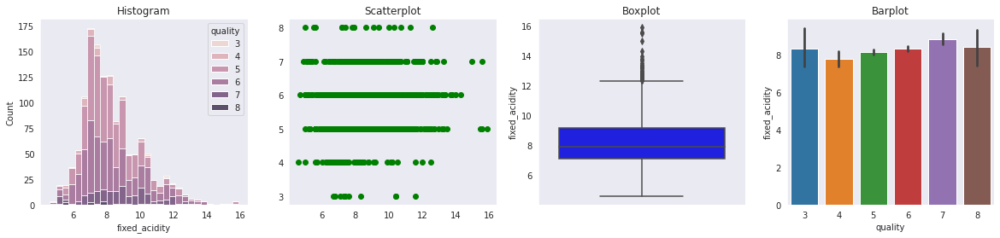

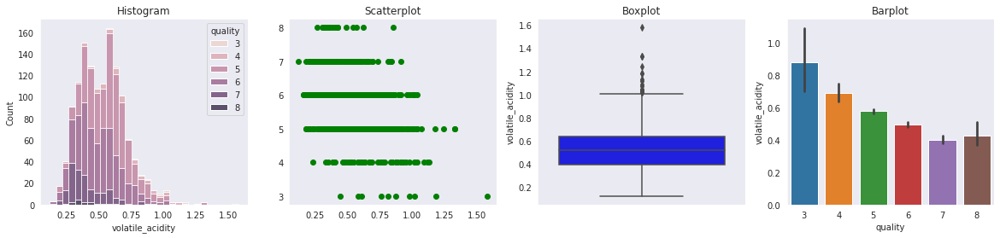

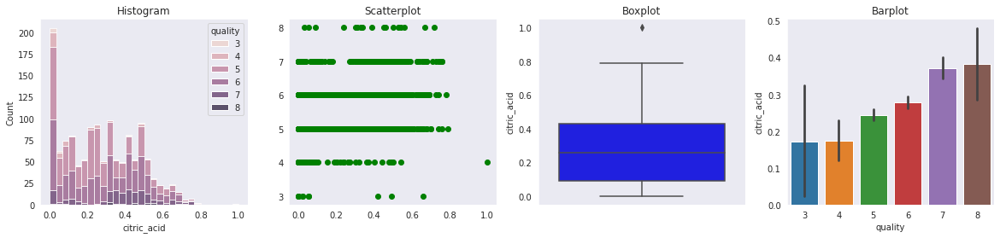

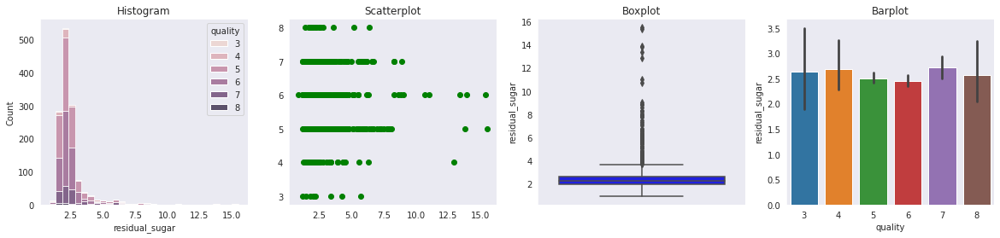

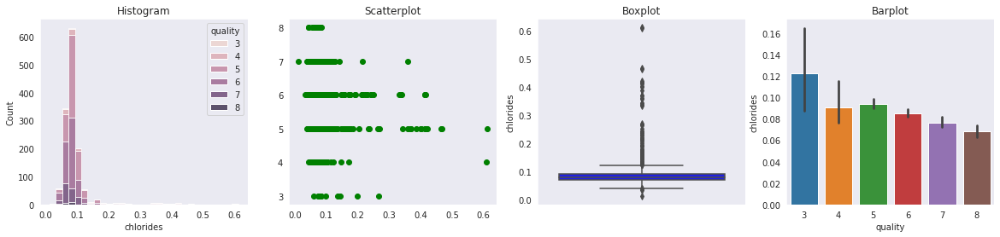

...

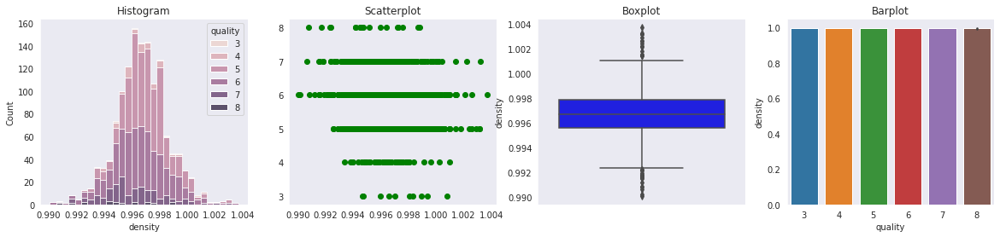

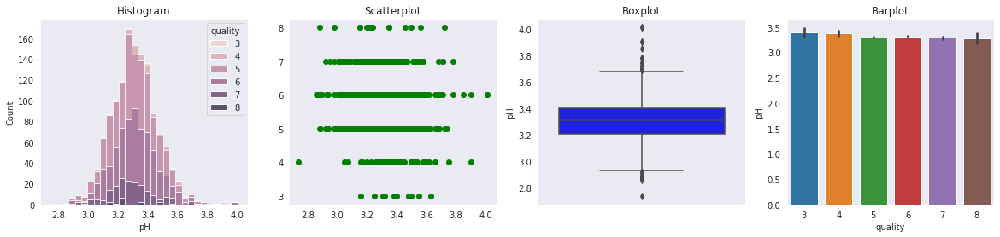

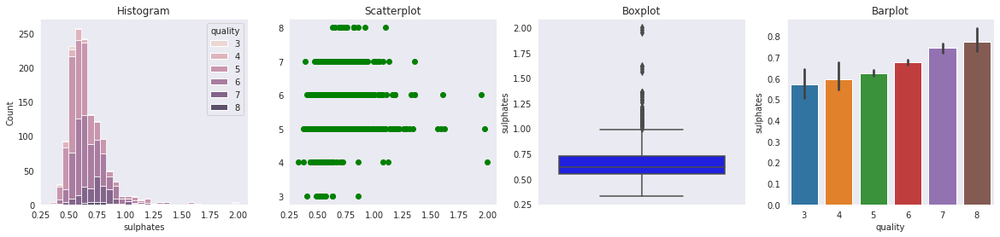

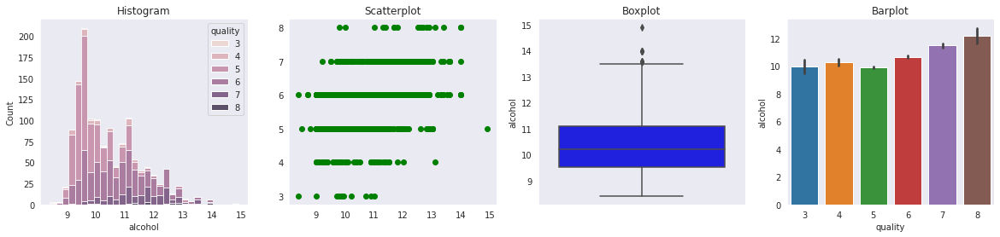

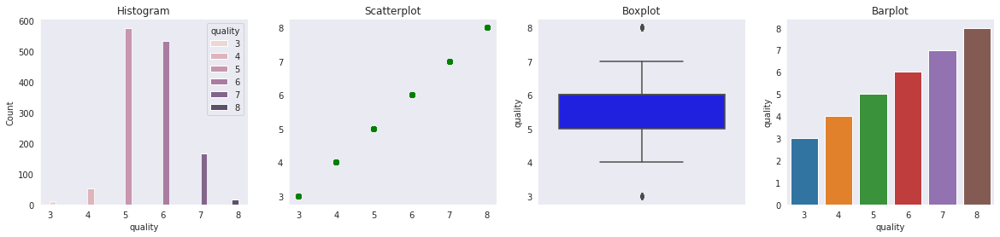

In [ ]:
for variable in data:
    plot_graph(data , variable, 'quality')

In [ ]:
quality_analysis = data.groupby(['quality']).describe().loc[:,(slice(None),['count','mean','min','max'])].T
quality_analysis

quality                             3           4           5           6  \
fixed_acidity        count  10.000000   53.000000  577.000000  535.000000   
                     mean    8.360000    7.779245    8.171231    8.337383   
                     min     6.700000    4.600000    5.000000    4.700000   
                     max    11.600000   12.500000   15.900000   14.300000   
volatile_acidity     count  10.000000   53.000000  577.000000  535.000000   
                     mean    0.884500    0.693962    0.578596    0.496084   
                     min     0.440000    0.230000    0.180000    0.160000   
                     max     1.580000    1.130000    1.330000    1.040000   
citric_acid          count  10.000000   53.000000  577.000000  535.000000   
                     mean    0.171000    0.174151    0.244523    0.279364   
                     min     0.000000    0.000000    0.000000    0.000000   
                     max     0.660000    1.000000    0.790000    0.780000   
residual_sugar       count  10.000000   53.000000  577.000000  535.000000   
                     mean    2.635000    2.694340    2.509532    2.457290   
                     min     1.200000    1.300000    1.200000    0.900000   
                     max     5.700000   12.900000   15.500000   15.400000   
chlorides            count  10.000000   53.000000  577.000000  535.000000   
                     mean    0.122500    0.090679    0.093971    0.085075   
                     min     0.061000    0.045000    0.039000    0.034000   
                     max     0.267000    0.610000    0.611000    0.415000   
free_sulfur_dioxide  count  10.000000   53.000000  577.000000  535.000000   
                     mean   11.000000   12.264151   17.161179   15.637383   
                     min     3.000000    3.000000    3.000000    1.000000   
                     max    34.000000   41.000000   68.000000   72.000000   
total_sulfur_dioxide count  10.000000   53.000000  577.000000  535.000000   
                     mean   24.900000   36.245283   57.406412   40.816822   
                     min     9.000000    7.000000    6.000000    6.000000   
                     max    49.000000  119.000000  155.000000  165.000000   
density              count  10.000000   53.000000  577.000000  535.000000   
                     mean    0.997464    0.996542    0.997082    0.996565   
                     min     0.994710    0.993400    0.992560    0.990070   
                     max     1.000800    1.001000    1.003150    1.003690   
pH                   count  10.000000   53.000000  577.000000  535.000000   
                     mean    3.398000    3.381509    3.300815    3.318000   
                     min     3.160000    2.740000    2.880000    2.860000   
                     max     3.630000    3.900000    3.740000    4.010000   
sulphates            count  10.000000   53.000000  577.000000  535.000000   
                     mean    0.570000    0.596415    0.623570    0.674542   
                     min     0.400000    0.330000    0.370000    0.400000   
                     max     0.860000    2.000000    1.980000    1.950000   
alcohol              count  10.000000   53.000000  577.000000  535.000000   
                     mean    9.955000   10.265094    9.888562   10.658879   
                     min     8.400000    9.000000    8.500000    8.400000   
                     max    11.000000   13.100000   14.900000   14.000000   

quality                              7          8  
fixed_acidity        count  167.000000  17.000000  
                     mean     8.858683   8.441176  
                     min      4.900000   5.000000  
                     max     15.600000  12.600000  
volatile_acidity     count  167.000000  17.000000  
                     mean     0.403653   0.427647  
                     min      0.120000   0.260000  
                     max      0.915000   0.850000  
citric_acid          count  167.000000  17.000000  
              

In [ ]:
def get_mean_data(df, stats_data):
  q_mean_final = []
  col_name = []
  for i in df.columns[:-1].tolist():
    col_name.append(i)
    q = []
    for l in [3,4,5,6,7,8]:
      q.append(stats_data[l][i]['mean'])
    q_mean_final.append(q)
  return q_mean_final, col_name
q_mean_final, col_name = get_mean_data(data, quality_analysis)

In [ ]:
def quality_analysis_plot(feature, mean_list, color):
  for i in range(0,11):
    fig=px.bar(y=mean_list[i],x = [3,4,5,6,7,8],title="<b>"+feature[i],color=mean_list[i],template="plotly", labels={'x':'Quality','y':'Mean'},
              color_continuous_scale=px.colors.sequential.Viridis)
    fig.update_layout(title_x=0.5,title_font_size=30,font_size=15,font_color="darkgrey")
    fig.show()
quality_analysis_plot(col_name, q_mean_final,'7')

In [ ]:
def plot_outliers(df):
  for i in df.columns[:-1]:
    fig = px.box(df, y = df[i], color = 'quality')
    fig.show()
plot_outliers(data)
    

In [ ]:
#Detect Outliers based on Quality. From each quality
def detect_quality_outlier(df):

  outlier_index = []
  for i in [3,4,5,6,7,8]:
    temp_data = data[data['quality']==i]
    for l in df.columns[:-1]:
      Q1,Q3 = np.percentile(temp_data[l], [25,75])
      IQR = Q3-Q1
      ul = Q3+1.5*IQR
      ll = Q1-1.5*IQR
      ol_data = temp_data[l][(temp_data[l] > ul) | (temp_data[l] < ll)]
      outlier_index.append(ol_data.index.tolist())
  return outlier_index
ol_list = detect_quality_outlier(data)
flatList = []
for elem in ol_list:
    flatList.extend(elem)
Outlier_list = flatList
print(f'Length of original list:{len(Outlier_list)}\nTotal numbers of duplicates: {len(list(set([x for i,x in enumerate(Outlier_list) if Outlier_list.count(x) > 1])))}')

Length of original list:516
Total numbers of duplicates: 108


In [ ]:
#Detect Outliers based on feature. From each feature
def detect_feature_outlier(df):
  outlier_index = []
  for l in df.columns[:-1]:
    Q1,Q3 = np.percentile(df[l], [25,75])
    IQR = Q3-Q1
    ul = Q3+1.5*IQR
    ll = Q1-1.5*IQR
    ol_data = df[l][(df[l] > ul) | (df[l] < ll)]
    outlier_index.append(ol_data.index.tolist())
  return outlier_index
ol_list2 = detect_feature_outlier(data)
flatList = []
for elem in ol_list2:
    flatList.extend(elem)
Outlier_list2 = flatList
print(f'Length of original list:{len(Outlier_list2)}\nTotal numbers of duplicates: {len(list(set([x for i,x in enumerate(Outlier_list2) if Outlier_list2.count(x) > 1])))}')

Length of original list:475
Total numbers of duplicates: 101


In [ ]:
#Get the union of two list and return final Outliers list 
def remove_duplicates(l1,l2):
  unique = list(set(l1+l2))
  return unique
Final_outlier_list = remove_duplicates(Outlier_list, Outlier_list2)
print(f'Length of Final Outlier List: {len(Final_outlier_list)}')

Length of Final Outlier List: 426


In [ ]:
#remove Outliers 
data.drop(Final_outlier_list, axis=0, inplace = True)

In [ ]:
data.shape

(933, 12)

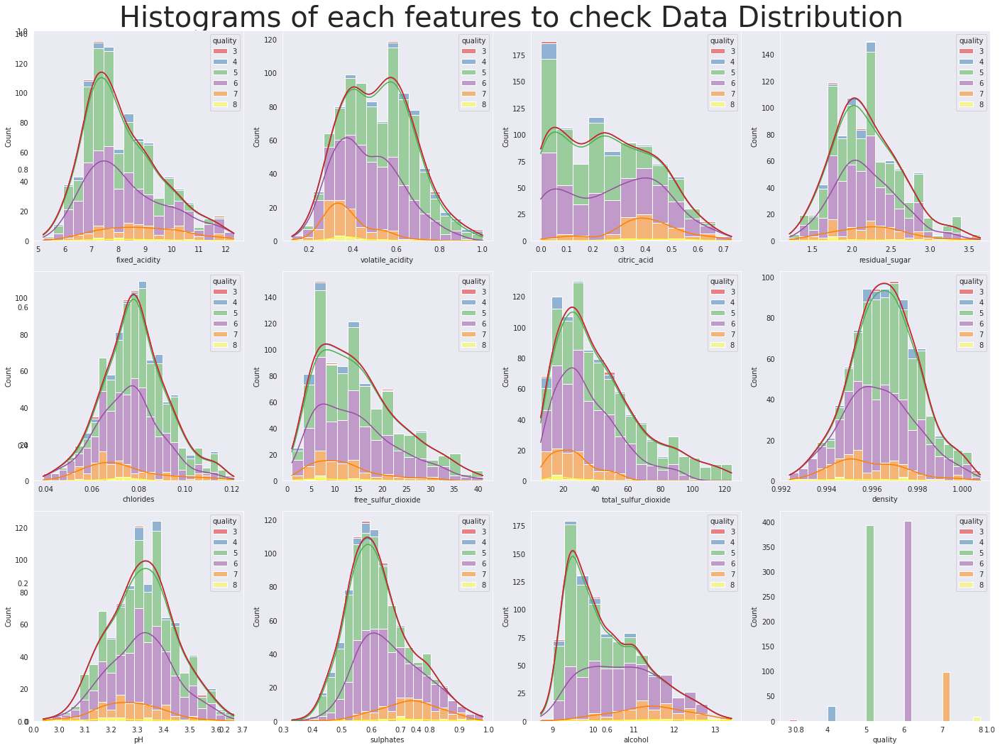

In [ ]:
fig = plt.figure(figsize=(20,15))
plt.title("Histograms of each features to check Data Distribution", fontsize = 40)
for i in range(len(data.columns)):
  sns.set_style("dark")
  fig.add_subplot(3,4,i+1)
  sns.histplot(x = data.iloc[:,i].dropna(), kde = True, hue = data.quality,multiple='stack', palette='Set1')
  plt.xlabel(data.columns[i])

plt.tight_layout()
plt.show()


In [ ]:
data['quality'].value_counts()

6    401
5    393
7     98
4     30
8      8
3      3
Name: quality, dtype: int64

In [ ]:
data.head()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
5,7.4,0.66,0.00,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4,5


#Modelling 

In [ ]:
features = data.drop(['quality'] , axis = 1)
target = data['quality']

In [ ]:
del features['fixed_acidity']
del features['free_sulfur_dioxide']
del features['citric_acid']
features

,volatile_acidity,residual_sugar,chlorides,total_sulfur_dioxide,density,pH,sulphates,alcohol
0,0.700,1.9,0.076,34.0,0.99780,3.51,0.56,9.4
1,0.880,2.6,0.098,67.0,0.99680,3.20,0.68,9.8
2,0.760,2.3,0.092,54.0,0.99700,3.26,0.65,9.8
3,0.280,1.9,0.075,60.0,0.99800,3.16,0.58,9.8
5,0.660,1.8,0.075,40.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...
1592,0.510,2.3,0.076,40.0,0.99574,3.42,0.75,11.0
1593,0.620,1.9,0.068,38.0,0.99651,3.42,0.82,9.5
1594,0.600,2.0,0.090,44.0,0.99490,3.45,0.58,10.5
1595,0.550,2.2,0.062,51.0,0.99512,3.52,0.76,11.2


In [ ]:
#Label Encoding
le = LabelEncoder()
y = le.fit_transform(data.iloc[: , -1])
y = pd.DataFrame(y.reshape(len(y),1))

In [ ]:
#Data spliting
x_train, x_test, y_train, y_test = train_test_split(features,y, test_size = 0.1, random_state = 41)

In [ ]:
y_train_cat = tf.keras.utils.to_categorical(y_train, 6)
y_test_cat = tf.keras.utils.to_categorical(y_test, 6)

In [ ]:
#Create feature columns for ANN
def create_feature_column():
    feat_volatile_acidity = tf.feature_column.numeric_column('volatile_acidity')
    feat_residual_sugar = tf.feature_column.numeric_column('residual_sugar')
    feat_chlorides = tf.feature_column.numeric_column('chlorides')
    feat_total_sulfur_dioxide  = tf.feature_column.numeric_column('total_sulfur_dioxide')
    feat_density              = tf.feature_column.numeric_column('density')
    feat_pH  = tf.feature_column.numeric_column('pH')
    feat_sulphates  = tf.feature_column.numeric_column('sulphates')
    feat_alcohol  = tf.feature_column.numeric_column('alcohol')


    feature_column = [ feat_volatile_acidity,feat_residual_sugar, feat_chlorides, 
                       feat_total_sulfur_dioxide,feat_density,feat_pH,feat_sulphates,feat_alcohol] 

    return feature_column
feature_column = create_feature_column()

In [ ]:
def traineval(x_train, y_train, training=False, batch_size=128):
    """An input function for training or evaluating"""
    # Convert the inputs to a Dataset.
    dataset = tf.data.Dataset.from_tensor_slices((dict(x_train), y_train))

    # Shuffle and repeat if you are in training mode.
    if training:
        dataset = dataset.shuffle(1000).repeat()

    return dataset.batch(batch_size)

In [ ]:
my_feature_columns = []
for key in data.keys():
    my_feature_columns.append(tf.feature_column.numeric_column(key=key))

In [ ]:
#Creat estomator
dnn = tf.estimator.DNNClassifier(hidden_units = [8,16,8],
                                      feature_columns = feature_column,
                                      n_classes= 6,
                                      activation_fn=tf.nn.softmax,
                                      dropout=None)

In [ ]:
#Train Model 
dnn.train(
    input_fn= lambda: traineval(x_train, y_train , training=True), steps=5000)

Instructions for updating:
Use Variable.read_value. Variables in 2.X are initialized automatically both in eager and graph (inside tf.defun) contexts.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


In [ ]:
eval_result = dnn.evaluate(input_fn=lambda: traineval(x_test, y_test, training=False))
predictions = dnn.predict(input_fn=lambda: traineval(x_test, y_test, training=False))

In [ ]:
print(eval_result)

{'accuracy': 0.40425533, 'average_loss': 1.6170559, 'loss': 1.6170559, 'global_step': 5000}


In [ ]:
#Standardise data
sc = StandardScaler()
x_train = sc.fit_transform(x_train)
x_test = sc.fit_transform(x_test)

In [ ]:
#Generate ANN
nn = tf.keras.models.Sequential(layers = None , name = None)
nn.add(tf.keras.layers.Input(shape = 11,))
nn.add(tf.keras.layers.Dense(units = 16 , activation = "relu" ))
tf.keras.layers.Dropout(0.3)
nn.add(tf.keras.layers.Dense(units = 8 , activation = "relu" ))
tf.keras.layers.Dropout(0.3)
nn.add(tf.keras.layers.Dense(units = 6 , activation = "softmax"))
nn.summary()
nn.compile(optimizer = 'adam' , loss = 'categorical_crossentropy' ,metrics= ['accuracy'])
history = nn.fit(x_train, y_train_cat,  batch_size= 32, epochs = 100 , validation_data = (x_test,y_test_cat))

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3 (Dense)             (None, 16)                192       
                                                                 
 dense_4 (Dense)             (None, 8)                 136       
                                                                 
 dense_5 (Dense)             (None, 6)                 54        
                                                                 
Total params: 382
Trainable params: 382
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
27/27 [==============================] - 2s 34ms/step - loss: 1.7981 - accuracy: 0.1633 - val_loss: 1.6539 - val_accuracy: 0.2553
Epoch 2/100
27/27 [==============================] - 0s 9ms/step - loss: 1.6268 - accuracy: 0.3313 - val_loss: 1.5143 - val_accuracy: 0.3723
Epoch 3/100
27/27 [==================

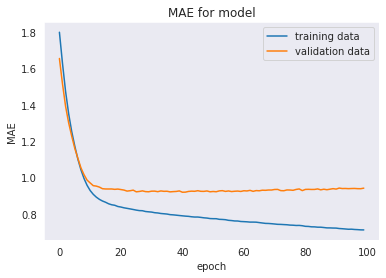

In [ ]:
#Here we plot the loss vs Validation loss using a line graph.
plt.plot(history.history['loss'], label='training data')
plt.plot(history.history['val_loss'], label='validation data')
plt.legend()
plt.title('MAE for model')
plt.ylabel('MAE')
plt.xlabel('epoch')
plt.show()

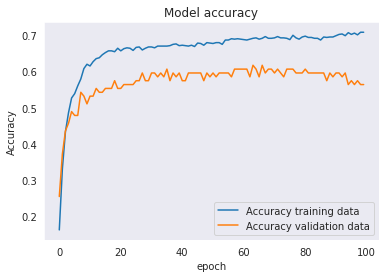

In [ ]:
#Here we plot the accuracy vs Validation accuracy loss using a line graph.
plt.plot(history.history['accuracy'], label='Accuracy training data')
plt.plot(history.history['val_accuracy'], label='Accuracy validation data')
plt.legend()
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('epoch')
plt.show()

Based on the research, i can conclude that, estimators is giving us less accuracy compare to AAN. Though both are same things. Estimator is very good in distributed programming. However, data is very less and after preprocessing, i hardly have 1000 rows. Though, i was able to get almost 70% accuracy. If we have more data then we can also do more precise modeling and can get more accuracy. 